## Advanced Lane Finding

In [1]:
import os
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

### Calibarte Camera
Calculate calibration matrix and distortion coefficients by a set of chessboard images

In [2]:
def calibrate_camera(cali_image_dir):
    # Use cv2.calibrateCamera() and cv2.undistort()
    objpoints = []
    imgpoints = []
    image_name_list = os.listdir(cali_image_dir)
    nx = 9
    ny = 5
    for image_name in image_name_list:
        objp = np.zeros((nx*ny, 3), np.float32)
        objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
        #print (objp)
        img = mpimg.imread(os.path.join(cali_image_dir, image_name))
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret:
            objpoints.append(objp)
            imgpoints.append(corners)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (1280, 720), None, None)
    return mtx, dist

In [3]:
mtx, dist = calibrate_camera('./camera_cal')

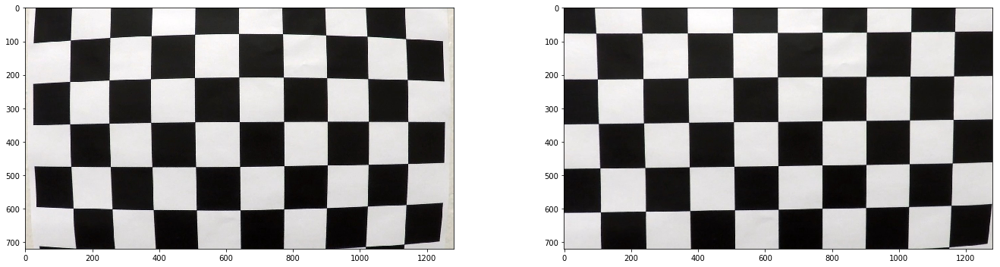

In [4]:
chess_img = mpimg.imread('./camera_cal/calibration1.jpg')
undist_chess_img = cv2.undistort(chess_img, mtx, dist, None, mtx)
fig = plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plt.imshow(chess_img)
plt.subplot(1, 2, 2)
plt.imshow(undist_chess_img)
plt.tight_layout()
plt.savefig("calibrate_chess.jpg")

### Gradient Threshold

In [5]:
def abs_sobel_threshold(img, orient='x', sobel_kernel=3, thresh=(20, 100)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

In [6]:
def mag_threshold(img, sobel_kernel=3, mag_thresh=(30, 100)):
    # Take both Sobel x and y gradients
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

In [7]:
def dir_threshold(img, sobel_kernel=3, thresh=(0.7, 1.3)):
    # Calculate the x and y gradients
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Apply threshold
    return dir_binary

### Combined Color Threshold

In [9]:
def color_threshold(img, orient='x', sx_thresh=(20, 100), s_thresh=(170, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary==1)] = 1
    return combined_binary

In [10]:
threshold_callbacks = {'gradient': abs_sobel_threshold, 'magnitude of gradient': mag_threshold,
                      'direction of gradient': dir_threshold, 'combined threshold': color_threshold}

In [11]:
def show_thresh_hold(test_image_dir, threshold_callbacks):
    image_name_list = os.listdir(test_image_dir)
    rows = len(image_name_list)
    cols = 5
    idx = 0
    fig = plt.figure(figsize=(8*cols, 5*rows))
    for image_name in image_name_list:
        img = mpimg.imread(os.path.join(test_image_dir, image_name))
        img = cv2.undistort(img, mtx, dist, None, mtx)
        
        idx = idx + 1
        plt.subplot(rows, cols, idx)
        plt.title(image_name, fontsize=30)
        plt.imshow(img)
        
        for callback_name in threshold_callbacks:
            idx = idx + 1
            output_binary = threshold_callbacks[callback_name](img)
            plt.subplot(rows, cols, idx)
            plt.title(callback_name, fontsize=30)
            plt.imshow(output_binary, cmap='gray')
    plt.tight_layout()
    plt.savefig("test_images_threshold.jpg")

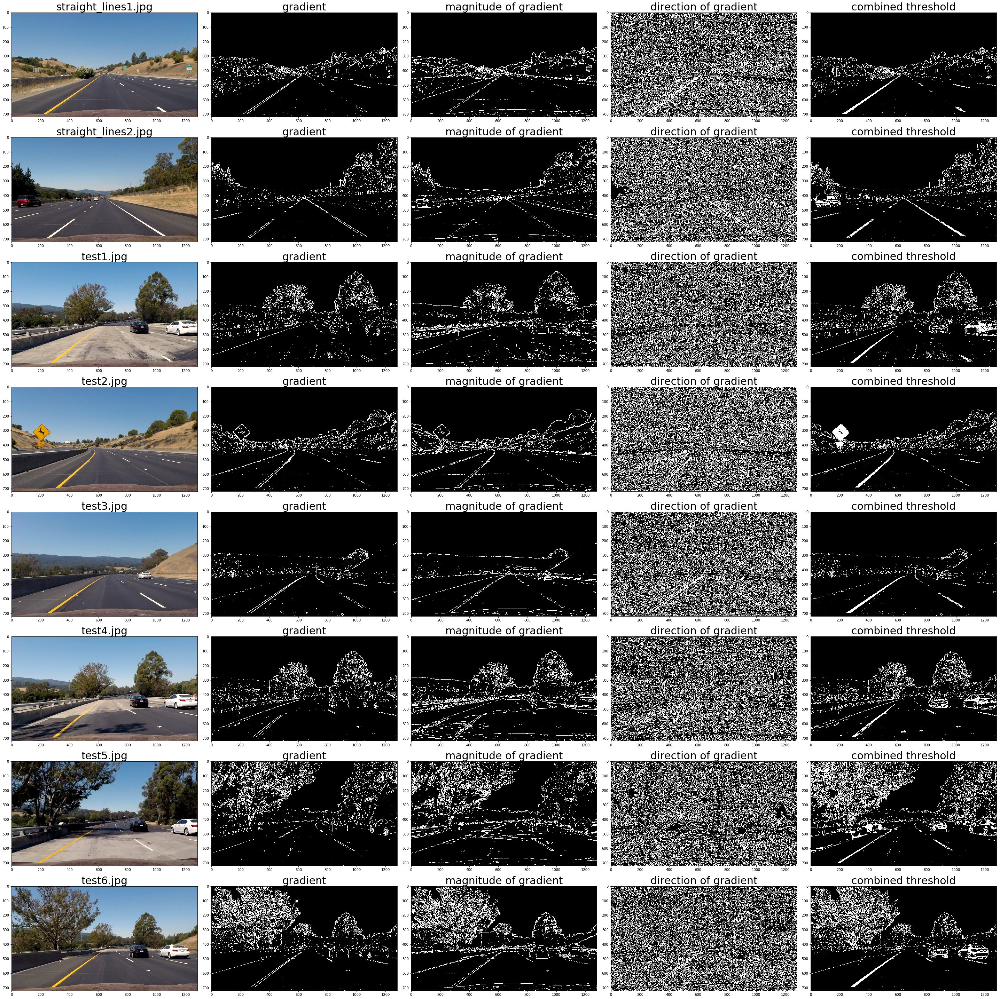

In [12]:
show_thresh_hold('./test_images', threshold_callbacks)

### Perspective Transform

In [13]:
def unwarp(undist, img_size):
    src = np.float32([[580, 460], [710, 460], [1150, 720], [150, 720]])
    dst = np.float32([[200, 0], [1080, 0], [1080, 720], [200, 720]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

In [14]:
def show_warp_images(test_image_dir):
    image_name_list = os.listdir(test_image_dir)
    idx = 0
    rows = 4
    cols = 4
    fig = plt.figure(figsize=(8*cols, 4*rows))
    for image_name in image_name_list:
        img = mpimg.imread(os.path.join(test_image_dir, image_name))
        img = cv2.undistort(img, mtx, dist, None, mtx)
        
        idx = idx + 1
        plt.subplot(rows, cols, idx)
        plt.imshow(img)
        
        undistort_img=cv2.undistort(img, mtx, dist, None, mtx)
        undistort_img = color_threshold(undistort_img)
        warp_img, M, Minv = unwarp(undistort_img, (undistort_img.shape[1], undistort_img.shape[0]))
        idx = idx + 1
        plt.subplot(rows, cols, idx)
        plt.imshow(warp_img, cmap='gray')
    plt.tight_layout()
    plt.savefig("test_images_warp.jpg")

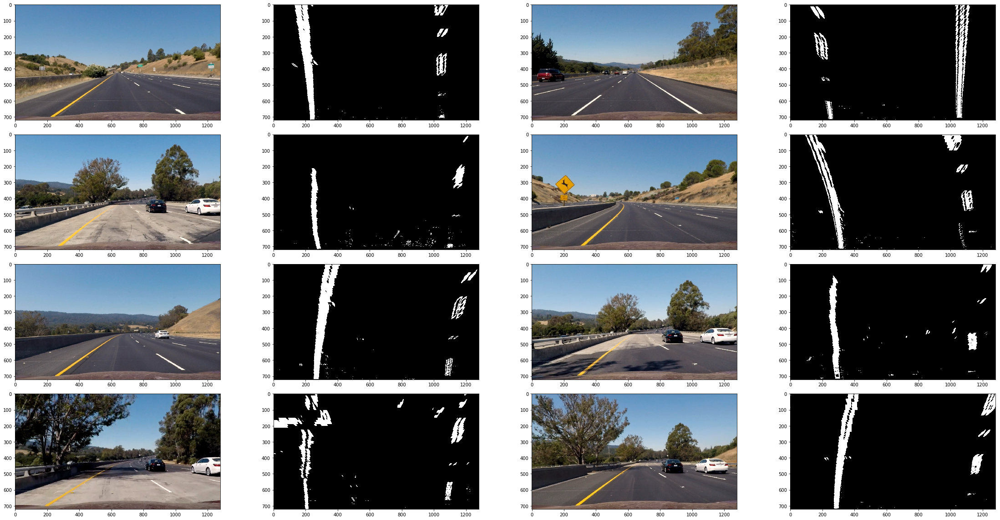

In [15]:
show_warp_images('./test_images')

### Find the Lane Lines by Polynomial Fits

In [16]:
class LineDetector():
    nwindows = 15
    margin = 70
    minpix = 40
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    @staticmethod
    def init_find_lanes(nonzerox, nonzeroy, leftx_current, rightx_current, img_height, out_img=np.array([])):
        window_height = np.int(img_height/LineDetector.nwindows)
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        # Step through the windows one by one
        for window in range(LineDetector.nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = img_height - (window+1)*window_height
            win_y_high = img_height - window*window_height
            win_xleft_low = leftx_current - LineDetector.margin
            win_xleft_high = leftx_current + LineDetector.margin
            win_xright_low = rightx_current - LineDetector.margin
            win_xright_high = rightx_current + LineDetector.margin
            if len(out_img) != 0:
                # Draw the windows on the visualization image
                cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
                cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                              (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                               (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > LineDetector.minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > LineDetector.minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
        
        if len(out_img) != 0:
            out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
            out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        return leftx, lefty, rightx, righty
    
    @staticmethod
    def find_lanes(nonzerox, nonzeroy, left_fit, right_fit):
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - LineDetector.margin)) &
                          (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + LineDetector.margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - LineDetector.margin)) &
                           (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] +LineDetector. margin)))  
        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        return leftx, lefty, rightx, righty
    
    @staticmethod
    def fit(x, y):
        fit_parameters = np.polyfit(y, x, 2)
        return fit_parameters
    
    @staticmethod
    def calc_curverad(fit_parameters, y_eval):
        curverad = ((1 + (2*fit_parameters[0]*y_eval + fit_parameters[1])**2)**1.5)/np.absolute(2*fit_parameters[0])
        return curverad
    
    @staticmethod
    def get_line_curverad(ploty, fit_parameters):
        curverad = None
        if len(fit_parameters) >= 2:
            y_eval = np.max(ploty)
            curverad = LineDetector.calc_curverad(fit_parameters, y_eval)
        return curverad
    
    @staticmethod
    def get_off_center(left_fit, right_fit):
        left = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
        right = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
        off_center = (640 - ((left + right)/2)) * LineDetector.xm_per_pix
        return off_center
    @staticmethod
    def sanity_check(old_curverad, new_curverad):
        if old_curverad and new_curverad and abs(new_curverad - old_curverad)/old_curverad < 0.5:
            return True
        else:
            return False

In [17]:
def show_fit_images(test_image_dir):
    image_name_list = os.listdir(test_image_dir)
    idx = 0
    rows = 8
    cols = 3
    fig = plt.figure(figsize=(5*cols, 3*rows))
    for image_name in image_name_list:
        img = mpimg.imread(os.path.join(test_image_dir, image_name))
        img = cv2.undistort(img, mtx, dist, None, mtx)
        
        idx = idx + 1
        plt.subplot(rows, cols, idx)
        plt.imshow(img)
        
        undistort_img=cv2.undistort(img, mtx, dist, None, mtx)
        undistort_img = color_threshold(undistort_img)
        warp_img, M, Minv = unwarp(undistort_img, (undistort_img.shape[1], undistort_img.shape[0]))
        nonzero = warp_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        ploty = np.linspace(0, warp_img.shape[0] - 1, warp_img.shape[0])
        idx = idx + 1
        histogram = np.sum(warp_img[int(warp_img.shape[0]/2):,:], axis=0)
        plt.subplot(rows, cols, idx)
        plt.plot(histogram)
        
        idx = idx + 1
        out_img = np.dstack((warp_img, warp_img, warp_img))*255
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint
        img_height = warp_img.shape[0]
        leftx, lefty, rightx, righty = LineDetector.init_find_lanes(nonzerox, nonzeroy,
                                                                    leftx_base, rightx_base, img_height, out_img)   
        left_fit = LineDetector.fit(leftx, lefty)
        right_fit = LineDetector.fit(rightx, righty)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        plt.subplot(rows, cols, idx)
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    plt.tight_layout()
    plt.savefig("test_images_fit.jpg")

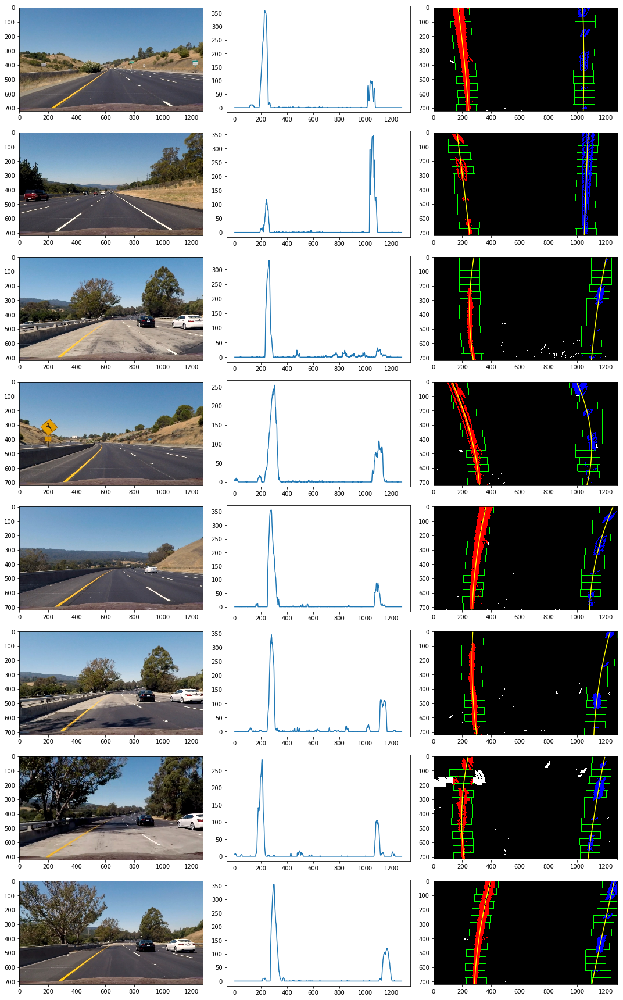

In [18]:
show_fit_images('./test_images')

In [19]:
class Lines():
    def reset(self):
        # x values of the last n fits of the line n = 5
        self.recent_xfitted = []
        self.recent_fits = []
        #average x values of the fitted line over the last n iterations
        self.bestx = np.array([])
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.array([])
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
    
    def __init__(self, maxKeep=5):
        self.reset()
        self.maxKeep = maxKeep
    
    def update(self, xfitted, fits, curverad):
        if len(xfitted) == 0 or len(fits) == 0:
            self.reset()
        else:
            self.recent_xfitted.append(xfitted.reshape(1,-1))
            self.recent_fits.append(fits.reshape(1,-1))
            
            if len(self.recent_xfitted) > self.maxKeep:
                self.recent_xfitted.pop(0)
                self.recent_fits.pop(0)   
            self.bestx = np.mean(np.vstack(self.recent_xfitted), axis=0)
            self.best_fit = np.mean(np.vstack(self.recent_fits), axis=0)
            self.radius_of_curverad = curverad

### Process Images

In [23]:
left_line = Lines()
right_line = Lines()
def find_lane_per_img(img):
    undistort_img =cv2.undistort(img, mtx, dist, None, mtx)
    undistort_img = color_threshold(undistort_img)
    warp_img, M, Minv = unwarp(undistort_img, (img.shape[1], img.shape[0]))
    nonzero = warp_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    #ploty = np.linspace(0, 719, num=720)
    ploty = np.linspace(0, warp_img.shape[0] - 1, warp_img.shape[0])
    
    if len(left_line.best_fit) != 0 and len(right_line.best_fit) != 0:
        leftx, lefty, rightx, righty = LineDetector.find_lanes(nonzerox, nonzeroy,
                                                               left_line.best_fit, right_line.best_fit)
    else:
        histogram = np.sum(warp_img[int(warp_img.shape[0]/2):,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint
        #img_height = np.int(warp_img.shape[0]/LineDetector.nwindows)
        img_height = warp_img.shape[0]
        # Identify the x and y positions of all nonzero pixels in the image
        leftx, lefty, rightx, righty = LineDetector.init_find_lanes(nonzerox, nonzeroy,
                                                                    leftx_base, rightx_base, img_height)   
    left_fit = LineDetector.fit(leftx, lefty)
    right_fit = LineDetector.fit(rightx, righty)
    
    leftx_cr = leftx*LineDetector.xm_per_pix
    lefty_cr = lefty*LineDetector.ym_per_pix
    rightx_cr = rightx*LineDetector.xm_per_pix
    righty_cr = righty*LineDetector.ym_per_pix
    
    left_fit_cr = LineDetector.fit(leftx_cr, lefty_cr)
    right_fit_cr = LineDetector.fit(rightx_cr, righty_cr)
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad = LineDetector.get_line_curverad(ploty, left_fit_cr)
    right_curverad = LineDetector.get_line_curverad(ploty, right_fit_cr)
    off_center = LineDetector.get_off_center(left_fit, right_fit)
    
    left_check = True
    if left_line.radius_of_curvature:
        LineDetector.sanity_check(left_line.radius_of_curvature, left_curverad)
    right_check = True
    if right_line.radius_of_curvature:
        LineDetector.sanity_check(right_line.radius_of_curvature, right_curverad)
    
    if left_check:
        left_line.update(left_fitx, left_fit, left_curverad)
    else:
        left_line.update(np.array([]), np.array([]), None)
    
    if right_check:
        right_line.update(right_fitx, right_fit, right_curverad)
    else:
        right_line.update(np.array([]), np.array([]), None)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warp_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    #print (left_line.best_fit)
    #print (right_line.best_fit)
    
    if len(left_line.best_fit) != 0 and len(right_line.best_fit) != 0:
        left_best_fitx = left_line.best_fit[0]*ploty**2 + left_line.best_fit[1]*ploty + left_line.best_fit[2]
        right_best_fitx = right_line.best_fit[0]*ploty**2 + right_line.best_fit[1]*ploty + right_line.best_fit[2]
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_best_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_best_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        text_str = 'off center to the left by {:.2f}m left radius: {:.2f}m, right radius: {:.2f}m'.format(
            off_center, left_curverad, right_curverad)
        
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (warp_img.shape[1], warp_img.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
        cv2.putText(result, text_str, (10,50), cv2.FONT_HERSHEY_SIMPLEX, .8,(255,255,255),2,cv2.LINE_AA)
    else:
        result = np.array([])
    return result

In [21]:
def show_test_images(test_image_dir):
    image_name_list = os.listdir(test_image_dir)
    idx = 0
    rows = 8
    cols = 2
    fig = plt.figure(figsize=(6*cols, 3*rows))
    for image_name in image_name_list:
        img = mpimg.imread(os.path.join(test_image_dir, image_name))
        
        idx = idx + 1
        plt.subplot(rows, cols, idx)
        plt.imshow(img)

        idx = idx + 1
        plt.subplot(rows, cols, idx)
        left_line = Lines()
        right_line = Lines()
        result = find_lane_per_img(img)
        if len(result) == 0:
            print ("result is empty")
        else:
            plt.imshow(result)
    plt.tight_layout()
    plt.savefig("test_images_fit_region.jpg")

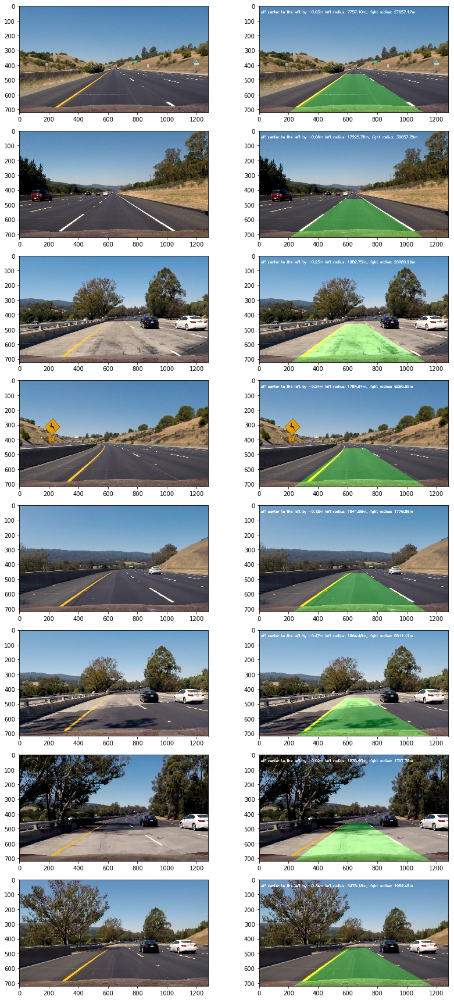

In [22]:
show_test_images('test_images')

In [24]:
from moviepy.editor import VideoFileClip, ImageSequenceClip
from IPython.display import HTML

In [25]:
clip1 = (VideoFileClip("project_video.mp4"))
output_clip1 = clip1.fl_image(find_lane_per_img) #NOTE: this function expects color images!!
%time output_clip1.write_videofile('project_video_output.mp4', audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [02:56<00:00,  7.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 4s, sys: 1min, total: 3min 5s
Wall time: 2min 57s
